<a href="https://colab.research.google.com/github/j-innovatech/registry1445/blob/main/article_registre1445.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Ce notebook présente les données et traitements relatifs au registre de 1445 pour le projet J-Innovatech.

Il s'agit de l'article ... publié dans ...

# Loading python libraries

In [ ]:
!pip install panda
!pip install geopandas

!pip install matplotlib==3.1.3
!pip install 'networkx<2.7'
!pip install 'scipy>=1.8'

import numpy as np

import pandas as pd
import matplotlib.pyplot as plt

import networkx as nx
import scipy as sc

  Preparing metadata (setup.py) ... done
  Created wheel for panda: filename=panda-0.3.1-py3-none-any.whl size=7238 sha256=088da05b6a804acbf14f1130f3e02ad1bc94e38f28be6500efaa74d6376d5f9c
  Stored in directory: /root/.cache/pip/wheels/0e/8b/c3/ff9cbde1fffd8071cff8367a86f0350a1ce30a8d31b6a432e9
Successfully built panda
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 MB 19.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for matplotlib: filename=matplotlib-3.1.3-cp310-cp310-linux_x86_64.whl size=11756931 sha256=573383ab339439b684bd0b35a291f4e39e0d4f8634bf163ca1415d06b2b1c7e9
  Stored in directory: /root/.cache/pip/wheels/a7/83/5a/c704868d367ace343ac89b928f3d937313a5b5fb5731483705
Successfully built matplotlib
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:


# Loading data

In [1]:
! git clone https://github.com/j-innovatech/registry1445
path = "./registry1445/data/"
#/content/registry1445

Cloning into 'registry1445'...
remote: Enumerating objects: 44, done.
remote: Counting objects: 100% (44/44), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 44 (delta 18), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (44/44), 1.03 MiB | 2.16 MiB/s, done.
Resolving deltas: 100% (18/18), done.


In [2]:
filepath = path + 'EXPERIMENTAL_Données_Registre_de_Hyogo_1445.csv'
# with open(filepath) as f:
#     registre1445 = f.read()

registre1445 = pd.read_csv(filepath, sep=';')
registre1445

NameError: name 'pd' is not defined

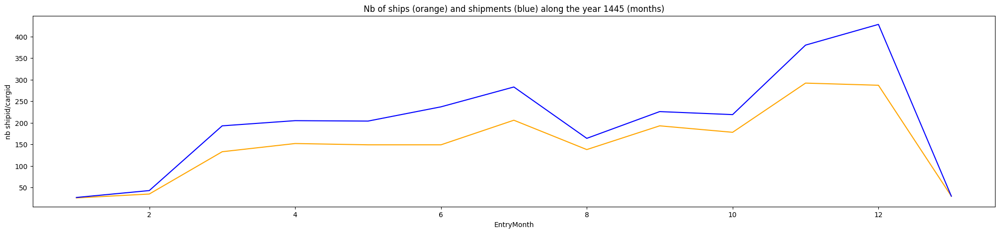

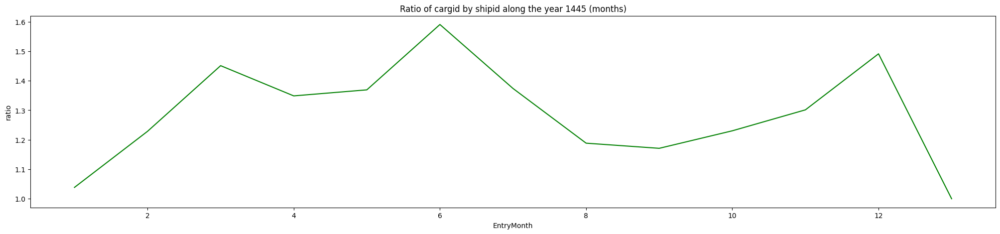

In [ ]:
# registre1445['shipid'].value_counts()

# x = (1,2,3,4,5,6,7,8,9,10,11,12)
shipid_by_month = registre1445.groupby("EntryMonth")['shipid'].nunique()
cargid_by_month = registre1445.groupby("EntryMonth")['cargid '].count()

#first plot with shipid / cargid
plt.figure(figsize=(25,5))
shipid_by_month.plot(color='orange')
cargid_by_month.plot(color='blue')

plt.xlabel('EntryMonth')
plt.ylabel('nb shipid/cargid')
plt.title("Nb of ships (orange) and shipments (blue) along the year 1445 (months)")
plt.show()

# second plot with ratio on cargid / shipid / by month
ratio = cargid_by_month / shipid_by_month
plt.figure(figsize=(25,5))
ratio.plot(x='EntryMonth',y='ratio', color='green')

plt.title("Ratio of cargid by shipid along the year 1445 (months)")
plt.xlabel('EntryMonth')
plt.ylabel('ratio')

plt.show()

#Analyses

Ventilation des shipid / cargid selon la classification suivante des cargquant (koku / kokume uniquement):

0 - 100

100 - 200

200 - 400

400 - 1000

plus de 1000

##Analyse du nombre de cargquant relativement aux classes définies ci-dessus

!!!! Attention toute la suite des analyses travaillera sur une sélection du registre avec les koku et kokume comme unité.
Il s'agit de la variable select_in_registre1445

Pour utiliser toutes les unités, il faut changer la variable en registre1445, ou réaliser une autre sélection.

DT: OK, pour l'instant se limiter aux koku/kokume est parfait.

<ipython-input-9-daee76a4e4b7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  select_in_registre1445['cargquant'] = select_in_registre1445['cargquant'].fillna(0)
<ipython-input-9-daee76a4e4b7>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  select_in_registre1445['cargquant'] = df['cargquant']


,cargquant
cargid,
"(0.0, 100.0]",97
"(100.0, 200.0]",94
"(200.0, 400.0]",178
"(400.0, 1000.0]",545
"(1000.0, 2300.0]",1082


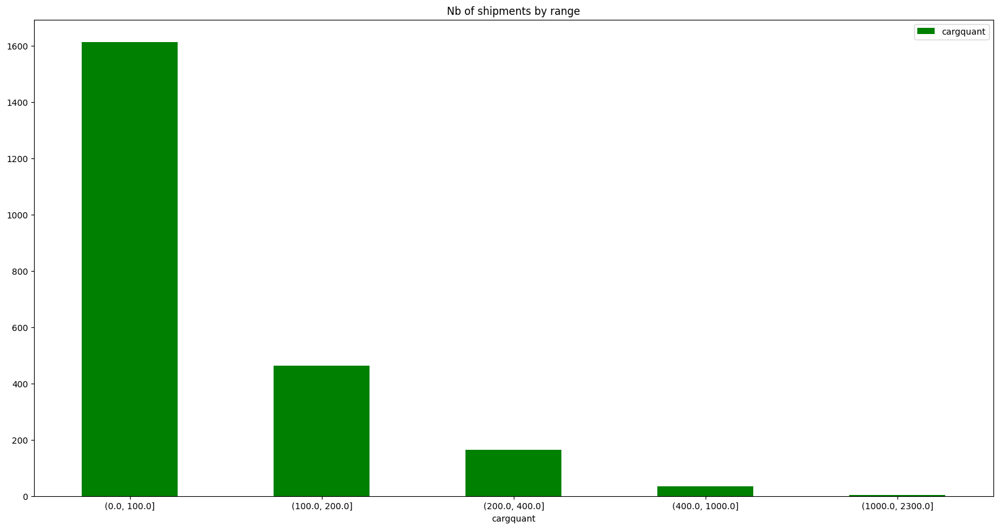

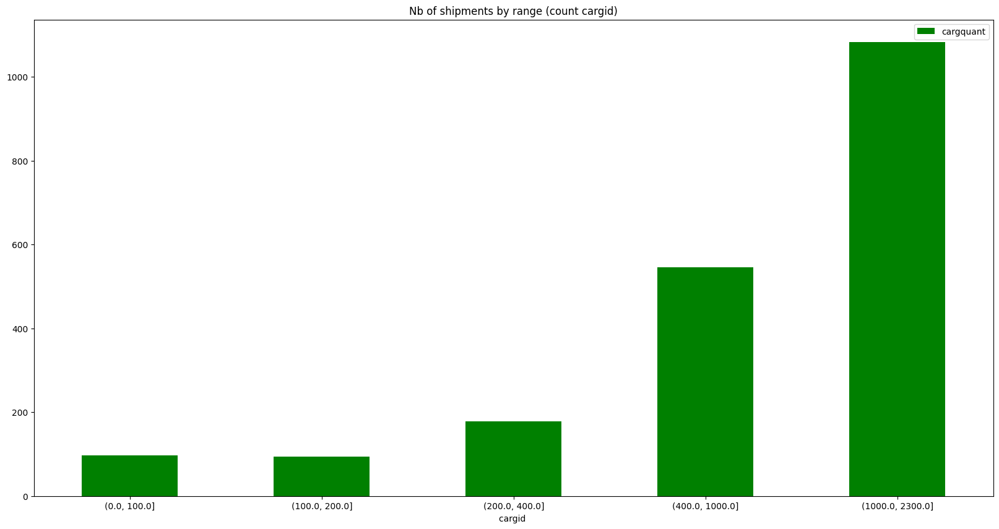

In [ ]:
#data must be filtered before / keep only koku & kokume lines in unit column (UoM)
select_in_registre1445 = registre1445.loc[registre1445['UoM'].isin(['koku', 'kokume'])]
select_in_registre1445['cargquant'] = select_in_registre1445['cargquant'].fillna(0)

# values contains only cargquant filtered with no null values
values = select_in_registre1445['cargquant']
#filter null values
values = values[~pd.isnull(values)]

#test values into ranges with panda dataframe (pd)
df = pd.DataFrame(values)

#convert , into . and convert to a numeric type
df = df.apply(lambda x: x.astype(str).str.replace(',','.').apply(pd.to_numeric))
select_in_registre1445['cargquant'] = df['cargquant']

#define classes
range = [min(select_in_registre1445['cargquant']), 100, 200, 400, 1000, max(select_in_registre1445['cargquant'])]

# group_by_range = select_in_registre1445.groupby(pd.cut(df['cargquant'], range)).count()
# plot_bar_group_by_range = group_by_range.plot(kind = 'bar', title = 'Nb of shipments by range', color = 'green', figsize=(20, 10), rot = 0) #if ticks has to be horizontal

# group_by_range

group_by_range = df.groupby(pd.cut(select_in_registre1445['cargquant'], range)).count()
plot_bar_group_by_range = group_by_range.plot(kind = 'bar', title = 'Nb of shipments by range', color = 'green', figsize=(20, 10), rot = 0) #if ticks has to be horizontal


# sum of carquant by ship
count_cargid_by_range = df.groupby(pd.cut(select_in_registre1445['cargid '], range)).count()
plot_bar_group_by_range_count_cargid = count_cargid_by_range.plot(kind = 'bar', title = 'Nb of shipments by range (count cargid)', color = 'green', figsize=(20, 10), rot = 0) #if ticks has to be horizontal

count_cargid_by_range

DT: le plus gros a un volume de 2300?

## Analyse du nombre de bateaux / du nombre de cargaison / port

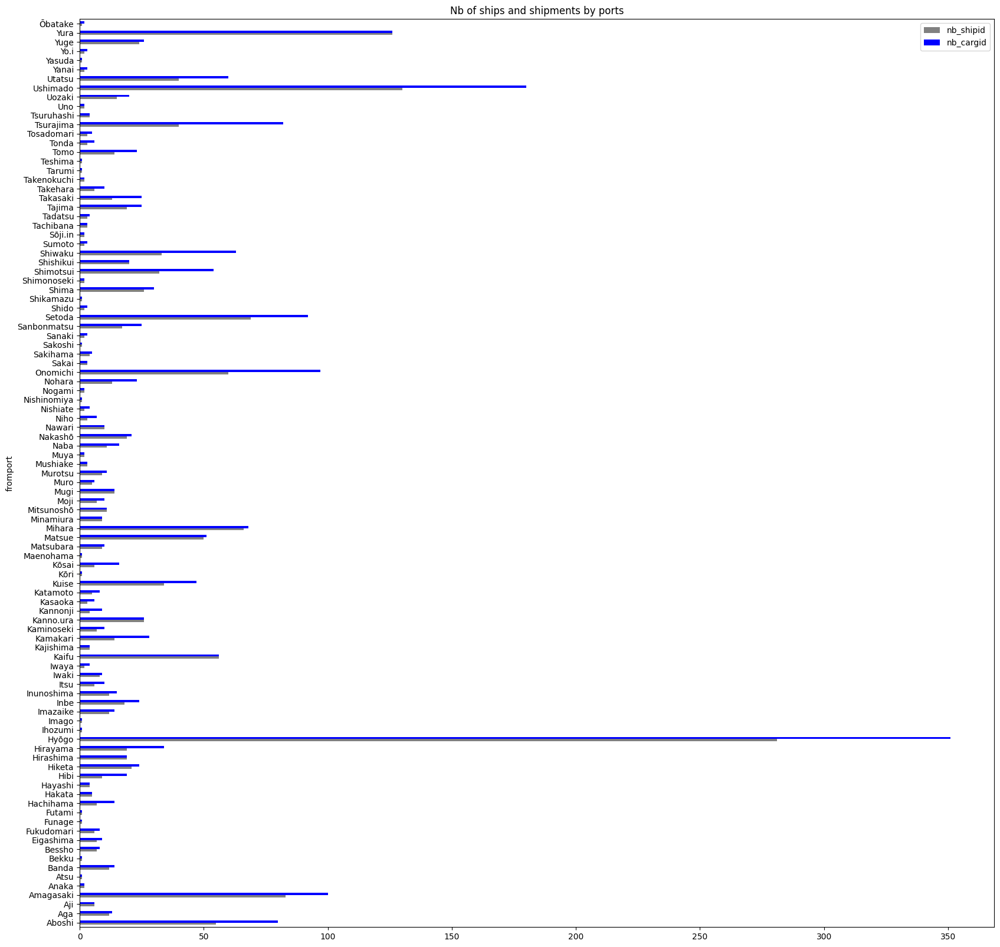

In [ ]:
shipid_by_port = select_in_registre1445.groupby("fromport")['shipid'].nunique()
# ax1 = shipid_by_port.plot(kind = 'barh', title = 'Nb of ships by ports', color = 'red', figsize=(20, 20))

cargid_by_port = select_in_registre1445.groupby("fromport")['cargid '].count()
# ax2 = cargid_by_port.plot(kind = 'barh', title = 'Nb of shipments by ports', color = 'green', figsize=(20, 20))

df_ship_carg = pd.DataFrame({'nb_shipid': shipid_by_port, 'nb_cargid': cargid_by_port})

ax = df_ship_carg.plot(kind = 'barh', title = 'Nb of ships and shipments by ports', color=['grey','blue'], figsize=(20, 20))
# bars = ax.barh(df_ship_carg.index, df_ship_carg.values)

<Axes: title={'center': 'Ratio shipments / ships by ports'}, ylabel='fromport'>

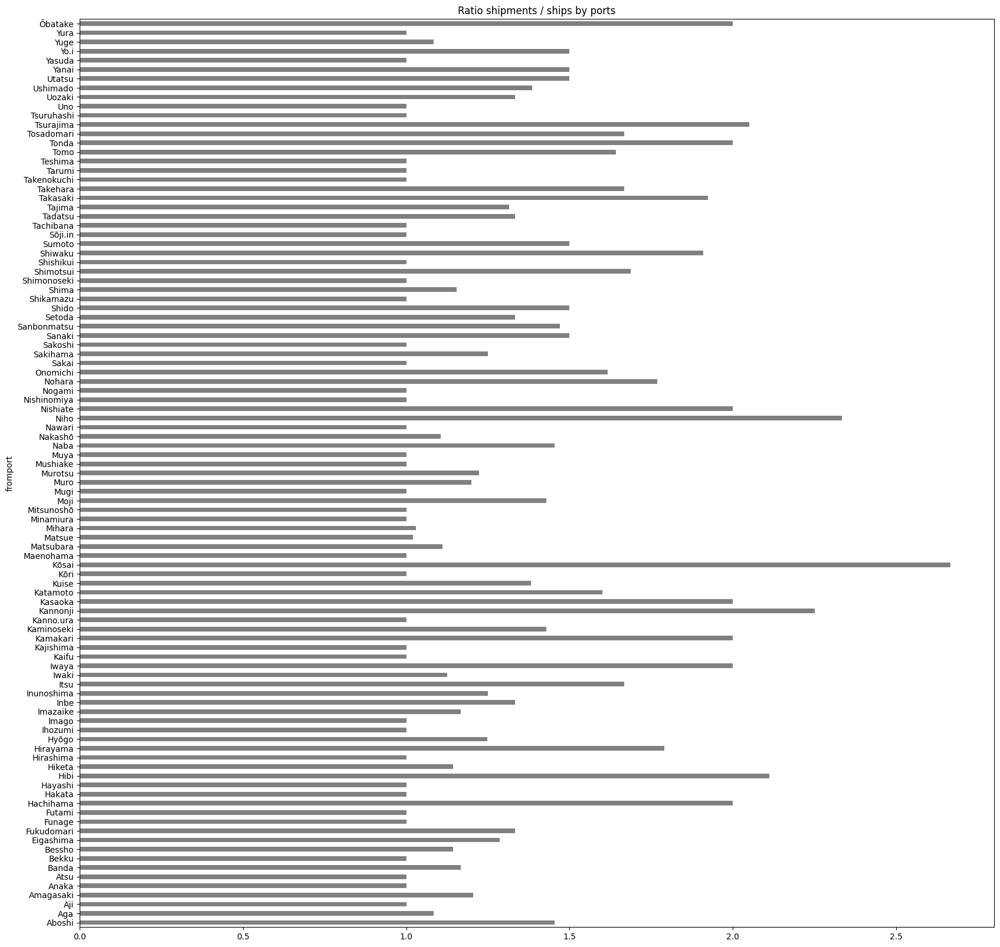

In [ ]:
ratio_shipid_cargid_by_port = cargid_by_port / shipid_by_port
ratio_shipid_cargid_by_port.plot(kind = 'barh', title = 'Ratio shipments / ships by ports', color = 'grey', figsize=(20, 20))

## Analyse des volumes de cargaison / ports

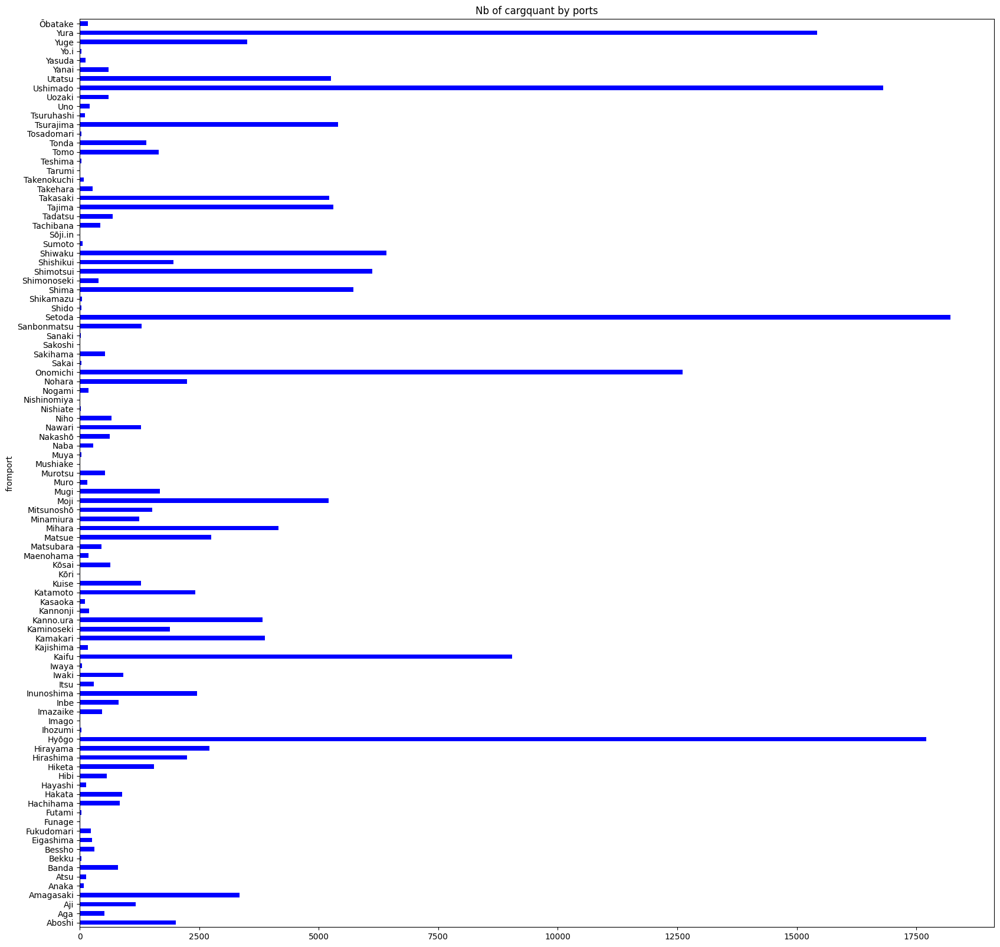

In [ ]:
# counting_by_ports_and_by_cargdf.value_counts(["Group", "Size"])
sum_cargid_by_port = select_in_registre1445.groupby("fromport")['cargquant'].sum()

ax = sum_cargid_by_port.plot(kind = 'barh', title = 'Nb of cargquant by ports', color=['blue'], figsize=(20, 20))

# sum_cargid_by_port

# Analyse des volumes de cargaison / type de cargaisons

### Calculs

In [ ]:
count_port_cargtype = select_in_registre1445.value_counts(["fromport", "cargtype"])
count_port_cartype_normalized = select_in_registre1445.value_counts(["fromport", "cargtype"], normalize=True)

#sum of cargquant by port and cargtype
sum_cargquant_by_port_by_cargtype = select_in_registre1445.groupby(by=["fromport", "cargtype"])['cargquant'].sum()

sum_cargquant_by_cargtype_by_port = select_in_registre1445.groupby(by=["EntryMonth", "cargtype"])['cargquant'].sum()
count_cargquant_by_cargtype_by_port = select_in_registre1445.groupby(by=["EntryMonth", "cargtype"])['cargquant'].count()

#select salt only

select_salt_in_registre1445 = registre1445.loc[registre1445['cargtype'].isin(['salt'])]

sum_cargquant_salt_by_port = select_salt_in_registre1445.groupby(by=["EntryMonth", "cargqual"])['cargquant']
count_cargquant_salt_by_port = select_salt_in_registre1445.groupby(by=["EntryMonth", "cargqual"])['cargquant'].count()

# select_in_registre1445.groupby("fromport", "cargtype")['cargquant'].sum()

all_cartype = list(select_in_registre1445['cargtype'].unique())
all_salt = list(select_salt_in_registre1445['cargqual'].unique())
all_ports = list(select_in_registre1445['fromport'].unique())
all_months = list(select_in_registre1445['EntryMonth'].unique())

#build a dictionnary with keys / values : port / cartype
dict_port_cartype = count_port_cargtype.to_dict()

#create a adjency matrix, first full of zeros
mat_cargtype = np.zeros((len(all_ports),len(all_cartype)))
mat_cargtype_normalized = np.zeros((len(all_ports),len(all_cartype)))
mat_cargquant = np.zeros((len(all_ports),len(all_cartype)))

mat_cargtype_by_month = np.zeros((len(all_months),len(all_cartype)))
mat_nb_cargquant_by_month = np.zeros((len(all_months),len(all_cartype)))

mat_cargquant_salt_by_month = np.zeros((len(all_months),len(all_salt)))
mat_nb_cargquant_salt_by_mont = np.zeros((len(all_months),len(all_salt)))

for i in all_ports:
  for j in all_cartype:
    index_port = all_ports.index(i)
    index_carg = all_cartype.index(j)

    if( all_cartype[index_carg] in count_port_cargtype[all_ports[index_port]]):

      # print(str(index_port) + ' ' + str(index_carg))
      # print(all_ports[index_port] + ' ' + all_cartype[index_carg] + ' value = ' + str(count_port_cargtype[all_ports[index_port]][all_cartype[index_carg]]))

      #fill matrices of cargtype / port
      mat_cargtype[index_port][index_carg] = count_port_cargtype[all_ports[index_port]][all_cartype[index_carg]]
      mat_cargtype_normalized[index_port][index_carg] = count_port_cartype_normalized[all_ports[index_port]][all_cartype[index_carg]]

      #fill matrice of sum of cargquant by port by cartype
      mat_cargquant[index_port][index_carg] = sum_cargquant_by_port_by_cargtype[all_ports[index_port]][all_cartype[index_carg]]
      # print('value in matrice : ' + str(mat[index_port][index_carg]))

for i in all_months:
  for j in all_cartype:
    index_month = all_months.index(i)
    index_carg = all_cartype.index(j)

    if( all_cartype[index_carg] in sum_cargquant_by_cargtype_by_port[all_months[index_month]]):

      mat_cargtype_by_month[index_month][index_carg] = sum_cargquant_by_cargtype_by_port[all_months[index_month]][all_cartype[index_carg]]
      mat_nb_cargquant_by_month[index_month][index_carg] = count_cargquant_by_cargtype_by_port[all_months[index_month]][all_cartype[index_carg]]

#building matrice of salt / month / cargqual
for i in all_months:
  for j in all_salt:
    index_month = all_months.index(i)
    index_salt = all_salt.index(j)

    # if( all_salt[index_salt] in sum_cargquant_salt_by_port[all_months[index_month]]):

    #   # print(sum_cargquant_salt_by_port)
    #   mat_cargquant_salt_by_month[index_month][index_salt] = sum_cargquant_salt_by_port[all_months[index_month]][all_salt[index_salt]]

    if( all_salt[index_salt] in count_cargquant_salt_by_port[all_months[index_month]]):
      mat_nb_cargquant_salt_by_mont[index_month][index_salt] = count_cargquant_salt_by_port[all_months[index_month]][all_salt[index_salt]]

transposed_mat_cargtype = mat_cargtype.transpose()
transposed_mat_cargtype_normalized = mat_cargtype_normalized.transpose() * 100
transposed_mat_cargtype_normalized *= 100

transposed_mat_cargquant = mat_cargquant.transpose()

transposed_mat_cartype_by_month = mat_cargtype_by_month.transpose()
transposed_mat_nb_cargquant_by_month = mat_nb_cargquant_by_month.transpose()

transposed_mat_cargquant_salt_by_month = mat_cargquant_salt_by_month.transpose()
transposed_mat_nb_cargquant_salt_by_month = mat_nb_cargquant_salt_by_mont.transpose()

print(sum_cargquant_salt_by_port)

## Matrices de confusions

In [ ]:
import seaborn as sns

styles = [
    dict(selector="th", props=[("font-weight","normal"),
                               ("text-align", "center")])]

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "8pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

# cmap = sns.diverging_palette(0, 120, as_cmap=True)
cmap = sns.light_palette("green", as_cmap=True)
bigdf = pd.DataFrame(transposed_mat_cargtype, index=all_cartype, columns=all_ports)

bigdf.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '5pt'})\
    .set_caption("Matrice of count of cargtype by ports")\
    .format(precision=2)\
    .set_table_styles(magnify())

,Hirashima,Hyōgo,Shima,Muro,Kuise,Nakashō,Mugi,Yura,Mihara,Tarumi,Hibi,Kannonji,Shimotsui,Hayashi,Kanno.ura,Kaifu,Matsue,Anaka,Amagasaki,Hiketa,Aji,Shishikui,Setoda,Shiwaku,Tadatsu,Yuge,Hakata,Tonda,Takasaki,Nogami,Sumoto,Tsurajima,Nohara,Katamoto,Utatsu,Hirayama,Hachihama,Sōji.in,Sanbonmatsu,Ushimado,Tomo,Onomichi,Kaminoseki,Nawari,Maenohama,Iwaya,Banda,Inunoshima,Tajima,Teshima,Moji,Shimonoseki,Niho,Mitsunoshō,Iwaki,Murotsu,Kamakari,Aboshi,Yo.i,Atsu,Kōsai,Inbe,Kasaoka,Minamiura,Sakai,Uozaki,Takehara,Yanai,Muya,Tsuruhashi,Itsu,Tosadomari,Shido,Sakihama,Sanaki,Fukudomari,Imazaike,Nishiate,Tachibana,Uno,Kōri,Matsubara,Eigashima,Ihozumi,Futami,Sakoshi,Imago,Bessho,Nishinomiya,Kajishima,Naba,Takenokuchi,Aga,Bekku,Shikamazu,Mushiake,Yasuda,Funage,Ōbatake
wood/construction materials,18.00,39.00,1.00,2.00,0.00,2.00,14.00,120.00,0.00,0.00,0.00,0.00,0.00,0.00,26.00,56.00,0.00,0.00,0.00,0.00,0.00,20.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,1.00,0.00,0.00,0.00,5.00,5.00,0.00,5.00,0.00,10.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,4.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,1.00,0.00,0.00
tinctorial plants and wood/dyeing materials,0.00,16.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
salt,0.00,120.00,24.00,0.00,8.00,7.00,0.00,5.00,65.00,1.00,6.00,0.00,32.00,2.00,0.00,0.00,38.00,1.00,25.00,17.00,6.00,0.00,65.00,29.00,2.00,24.00,5.00,1.00,10.00,0.00,1.00,32.00,11.00,5.00,35.00,16.00,7.00,0.00,4.00,96.00,13.00,53.00,4.00,0.00,0.00,1.00,7.00,11.00,18.00,1.00,0.00,0.00,2.00,11.00,6.00,7.00,0.00,40.00,0.00,1.00,5.00,0.00,2.00,9.00,2.00,2.00,6.00,1.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,4.00,6.00,2.00,0.00,2.00,0.00,3.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,5.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00
rice,0.00,87.00,3.00,1.00,38.00,9.00,0.00,0.00,2.00,0.00,6.00,4.00,7.00,2.00,0.00,0.00,9.00,1.00,68.00,2.00,0.00,0.00,4.00,4.00,1.00,0.00,0.00,3.00,4.00,2.00,2.00,10.00,1.00,1.00,2.00,6.00,3.00,0.00,14.00,25.00,2.00,18.00,6.00,0.00,0.00,2.00,2.00,1.00,2.00,0.00,7.00,2.00,2.00,0.00,2.00,1.00,6.00,27.00,2.00,0.00,6.00,1.00,1.00,0.00,1.00,14.00,0.00,1.00,0.00,0.00,5.00,2.00,1.00,1.00,0.00,4.00,7.00,1.00,0.00,0.00,1.00,5.00,8.00,1.00,1.00,0.00,1.00,7.00,1.00,4.00,2.00,1.00,11.00,0.00,1.00,0.00,0.00,0.00,1.00
beans,0.00,28.00,0.00,2.00,0.00,0.00,0.00,0.00,1.00,0.00,2.00,2.00,8.00,0.00,0.00,0.00,3.00,0.00,4.00,1.00,0.00,0.00,13.00,7.00,0.00,1.00,0.00,0.00,7.00,0.00,0.00,14.00,1.00,0.00,5.00,3.00,0.00,0.00,1.00,21.00,2.00,15.00,0.00,0.00,0.00,0.00,0.00,2.00,2.00,0.00,2.00,0.00,1.00,0.00,1.00,0.00,16.00,4.00,1.00,0.00,2.00,7.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
algae,1.00,13.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
cereals,0.00,34.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2.00,7.00,0.00,0.00,0.00,0.00,0.00,2.00,3.00,0.00,0.00,2.00,1

Même chose mais avec des valeurs normalisées entre 0 et 1, puis x 100.

In [ ]:
cmap_normalized = sns.light_palette("blue", as_cmap=True)
bigdf_normalized = pd.DataFrame(transposed_mat_cargtype_normalized, index=all_cartype, columns=all_ports)

bigdf_normalized.style.background_gradient(cmap_normalized, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '5pt'})\
    .set_caption("Matrice of count of cargtype by ports (normalized / 100%)")\
    .format(precision=2)\
    .set_table_styles(magnify())

,Hirashima,Hyōgo,Shima,Muro,Kuise,Nakashō,Mugi,Yura,Mihara,Tarumi,Hibi,Kannonji,Shimotsui,Hayashi,Kanno.ura,Kaifu,Matsue,Anaka,Amagasaki,Hiketa,Aji,Shishikui,Setoda,Shiwaku,Tadatsu,Yuge,Hakata,Tonda,Takasaki,Nogami,Sumoto,Tsurajima,Nohara,Katamoto,Utatsu,Hirayama,Hachihama,Sōji.in,Sanbonmatsu,Ushimado,Tomo,Onomichi,Kaminoseki,Nawari,Maenohama,Iwaya,Banda,Inunoshima,Tajima,Teshima,Moji,Shimonoseki,Niho,Mitsunoshō,Iwaki,Murotsu,Kamakari,Aboshi,Yo.i,Atsu,Kōsai,Inbe,Kasaoka,Minamiura,Sakai,Uozaki,Takehara,Yanai,Muya,Tsuruhashi,Itsu,Tosadomari,Shido,Sakihama,Sanaki,Fukudomari,Imazaike,Nishiate,Tachibana,Uno,Kōri,Matsubara,Eigashima,Ihozumi,Futami,Sakoshi,Imago,Bessho,Nishinomiya,Kajishima,Naba,Takenokuchi,Aga,Bekku,Shikamazu,Mushiake,Yasuda,Funage,Ōbatake
wood/construction materials,78.23,169.49,4.35,8.69,0.00,8.69,60.84,521.51,0.00,0.00,0.00,0.00,0.00,0.00,112.99,243.37,0.00,0.00,0.00,0.00,0.00,86.92,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.69,0.00,0.00,4.35,0.00,0.00,0.00,21.73,21.73,0.00,21.73,0.00,43.46,4.35,0.00,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,4.35,4.35,0.00,0.00,0.00,17.38,0.00,0.00,0.00,0.00,0.00,0.00,13.04,0.00,0.00,0.00,0.00,13.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,13.04,4.35,0.00,0.00
tinctorial plants and wood/dyeing materials,0.00,69.53,0.00,0.00,0.00,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.69,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.35,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
salt,0.00,521.51,104.30,0.00,34.77,30.42,0.00,21.73,282.49,4.35,26.08,0.00,139.07,8.69,0.00,0.00,165.15,4.35,108.65,73.88,26.08,0.00,282.49,126.03,8.69,104.30,21.73,4.35,43.46,0.00,4.35,139.07,47.81,21.73,152.11,69.53,30.42,0.00,17.38,417.21,56.50,230.33,17.38,0.00,0.00,4.35,30.42,47.81,78.23,4.35,0.00,0.00,8.69,47.81,26.08,30.42,0.00,173.84,0.00,4.35,21.73,0.00,8.69,39.11,8.69,8.69,26.08,4.35,0.00,0.00,13.04,0.00,0.00,0.00,0.00,17.38,26.08,8.69,0.00,8.69,0.00,13.04,4.35,0.00,0.00,0.00,0.00,4.35,0.00,0.00,21.73,0.00,8.69,0.00,0.00,0.00,0.00,0.00,0.00
rice,0.00,378.10,13.04,4.35,165.15,39.11,0.00,0.00,8.69,0.00,26.08,17.38,30.42,8.69,0.00,0.00,39.11,4.35,295.52,8.69,0.00,0.00,17.38,17.38,4.35,0.00,0.00,13.04,17.38,8.69,8.69,43.46,4.35,4.35,8.69,26.08,13.04,0.00,60.84,108.65,8.69,78.23,26.08,0.00,0.00,8.69,8.69,4.35,8.69,0.00,30.42,8.69,8.69,0.00,8.69,4.35,26.08,117.34,8.69,0.00,26.08,4.35,4.35,0.00,4.35,60.84,0.00,4.35,0.00,0.00,21.73,8.69,4.35,4.35,0.00,17.38,30.42,4.35,0.00,0.00,4.35,21.73,34.77,4.35,4.35,0.00,4.35,30.42,4.35,17.38,8.69,4.35,47.81,0.00,4.35,0.00,0.00,0.00,4.35
beans,0.00,121.69,0.00,8.69,0.00,0.00,0.00,0.00,4.35,0.00,8.69,8.69,34.77,0.00,0.00,0.00,13.04,0.00,17.38,4.35,0.00,0.00,56.50,30.42,0.00,4.35,0.00,0.00,30.42,0.00,0.00,60.84,4.35,0.00,21.73,13.04,0.00,0.00,4.35,91.26,8.69,65.19,0.00,0.00,0.00,0.00,0.00,8.69,8.69,0.00,8.69,0.00,4.35,0.00,4.35,0.00,69.53,17.38,4.35,0.00,8.69,30.42,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.35,0.00,0.00,0.00,4.35,0.00,4.35,0.00,0.00,0.00,0.00,8.69,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.35
algae,4.35,56.50,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.35,0.00,0.00,0.00,0.00,0.00,0.00,0.00
cereals,0.00,147.76,8.69,0.00,0.00,0.00,0.

Matrice avec la somme des cargquant / ports / type de cargaison

In [ ]:
cmap_cargquant = sns.light_palette("red", as_cmap=True)
bigdf_cargquant = pd.DataFrame(transposed_mat_cargquant, index=all_cartype, columns=all_ports)

bigdf_cargquant.style.background_gradient(cmap_cargquant, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '5pt'})\
    .set_caption("Matrice of sum of cargquant by ports by cargtype")\
    .format(precision=2)\
    .set_table_styles(magnify())

,Hirashima,Hyōgo,Shima,Muro,Kuise,Nakashō,Mugi,Yura,Mihara,Tarumi,Hibi,Kannonji,Shimotsui,Hayashi,Kanno.ura,Kaifu,Matsue,Anaka,Amagasaki,Hiketa,Aji,Shishikui,Setoda,Shiwaku,Tadatsu,Yuge,Hakata,Tonda,Takasaki,Nogami,Sumoto,Tsurajima,Nohara,Katamoto,Utatsu,Hirayama,Hachihama,Sōji.in,Sanbonmatsu,Ushimado,Tomo,Onomichi,Kaminoseki,Nawari,Maenohama,Iwaya,Banda,Inunoshima,Tajima,Teshima,Moji,Shimonoseki,Niho,Mitsunoshō,Iwaki,Murotsu,Kamakari,Aboshi,Yo.i,Atsu,Kōsai,Inbe,Kasaoka,Minamiura,Sakai,Uozaki,Takehara,Yanai,Muya,Tsuruhashi,Itsu,Tosadomari,Shido,Sakihama,Sanaki,Fukudomari,Imazaike,Nishiate,Tachibana,Uno,Kōri,Matsubara,Eigashima,Ihozumi,Futami,Sakoshi,Imago,Bessho,Nishinomiya,Kajishima,Naba,Takenokuchi,Aga,Bekku,Shikamazu,Mushiake,Yasuda,Funage,Ōbatake
wood/construction materials,1830.00,4050.00,10.00,100.00,0.00,20.00,1680.00,14990.00,0.00,0.00,0.00,0.00,0.00,0.00,3830.00,9040.00,0.00,0.00,0.00,0.00,0.00,1960.00,70.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,65.00,0.00,0.00,15.00,0.00,0.00,0.00,295.00,610.00,0.00,65.00,0.00,1280.00,180.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,70.00,0.00,0.00,0.00,0.00,0.00,60.00,35.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,480.00,0.00,0.00,0.00,0.00,430.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,120.00,0.00,0.00
tinctorial plants and wood/dyeing materials,0.00,413.00,0.00,0.00,0.00,0.00,0.00,23.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,14.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.00,0.00,0.00,4.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
salt,0.00,7124.00,5497.00,0.00,180.00,227.00,0.00,410.00,3953.00,15.00,220.00,0.00,5210.00,60.00,0.00,0.00,2256.00,60.00,854.00,1391.00,1175.00,0.00,16650.00,5095.00,680.00,3298.00,890.00,50.00,2140.00,0.00,17.00,3682.00,1535.00,2390.00,4425.00,2340.50,540.00,0.00,350.00,11647.00,1315.00,9410.00,205.00,0.00,0.00,15.00,570.00,2340.00,4897.00,40.00,0.00,0.00,70.00,1520.00,865.00,395.00,0.00,1092.00,0.00,130.00,435.00,0.00,28.00,1240.00,35.00,40.00,273.00,100.00,0.00,0.00,45.00,0.00,0.00,0.00,0.00,110.00,200.00,15.00,0.00,210.00,0.00,111.00,10.00,0.00,0.00,0.00,0.00,30.00,0.00,0.00,55.00,0.00,50.00,0.00,0.00,0.00,0.00,0.00,0.00
rice,0.00,4561.50,33.00,22.00,1048.00,269.00,0.00,0.00,77.00,0.00,205.00,95.00,395.00,75.50,0.00,0.00,407.00,22.00,2310.00,30.00,0.00,0.00,85.00,83.00,10.00,0.00,0.00,1220.00,2200.00,190.00,45.00,555.00,15.00,10.00,15.00,90.00,90.00,0.00,615.00,2215.00,20.00,1680.00,1680.00,0.00,0.00,23.00,11.00,5.00,90.00,0.00,4704.00,400.00,280.00,0.00,27.00,25.00,1200.00,746.00,34.50,0.00,155.00,15.50,15.00,0.00,3.00,476.50,0.00,500.00,0.00,0.00,220.00,12.00,12.00,10.00,0.00,130.00,223.00,3.00,0.00,0.00,13.00,174.50,245.00,32.00,35.00,0.00,0.00,283.00,15.00,175.00,60.00,60.00,465.00,0.00,55.00,0.00,0.00,0.00,120.00
beans,0.00,673.00,0.00,25.00,0.00,0.00,0.00,0.00,130.00,0.00,20.00,15.00,255.00,0.00,0.00,0.00,55.00,0.00,97.00,15.00,0.00,0.00,710.00,363.00,0.00,20.00,0.00,0.00,440.00,0.00,0.00,465.00,10.00,0.00,120.00,50.50,0.00,0.00,30.00,882.00,35.00,1250.00,0.00,0.00,0.00,0.00,0.00,100.00,80.00,0.00,300.00,0.00,70.00,0.00,15.00,0.00,1990.00,45.00,8.00,0.00,33.00,445.00,25.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,5.00,0.00,45.00,0.00,0.00,0.00,0.00,176.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,31.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,50.00
algae,410.00,405.00,0.00,0.00,60.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00

Volume par cargaison

In [ ]:
transposed_volume_by_cargaison = transposed_mat_cargquant / transposed_mat_cargtype

cmap_volume_carg = sns.light_palette("yellow", as_cmap=True)
bigdf_v_by_carg = pd.DataFrame(transposed_volume_by_cargaison, index=all_cartype, columns=all_ports)

bigdf_v_by_carg.style.background_gradient(cmap_volume_carg, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '5pt'})\
    .set_caption("Matrice of volume divided by cargquant by ports by cargtype")\
    .format(precision=2)\
    .set_table_styles(magnify())

<ipython-input-20-221974d53b9c>:1: RuntimeWarning: invalid value encountered in divide
  transposed_volume_by_cargaison = transposed_mat_cargquant / transposed_mat_cargtype


,Hirashima,Hyōgo,Shima,Muro,Kuise,Nakashō,Mugi,Yura,Mihara,Tarumi,Hibi,Kannonji,Shimotsui,Hayashi,Kanno.ura,Kaifu,Matsue,Anaka,Amagasaki,Hiketa,Aji,Shishikui,Setoda,Shiwaku,Tadatsu,Yuge,Hakata,Tonda,Takasaki,Nogami,Sumoto,Tsurajima,Nohara,Katamoto,Utatsu,Hirayama,Hachihama,Sōji.in,Sanbonmatsu,Ushimado,Tomo,Onomichi,Kaminoseki,Nawari,Maenohama,Iwaya,Banda,Inunoshima,Tajima,Teshima,Moji,Shimonoseki,Niho,Mitsunoshō,Iwaki,Murotsu,Kamakari,Aboshi,Yo.i,Atsu,Kōsai,Inbe,Kasaoka,Minamiura,Sakai,Uozaki,Takehara,Yanai,Muya,Tsuruhashi,Itsu,Tosadomari,Shido,Sakihama,Sanaki,Fukudomari,Imazaike,Nishiate,Tachibana,Uno,Kōri,Matsubara,Eigashima,Ihozumi,Futami,Sakoshi,Imago,Bessho,Nishinomiya,Kajishima,Naba,Takenokuchi,Aga,Bekku,Shikamazu,Mushiake,Yasuda,Funage,Ōbatake
wood/construction materials,101.67,103.85,10.00,50.00,nan,10.00,120.00,124.92,nan,nan,nan,nan,nan,nan,147.31,161.43,nan,nan,nan,nan,nan,98.00,70.00,nan,nan,nan,nan,nan,nan,nan,nan,32.50,nan,nan,15.00,nan,nan,nan,59.00,122.00,nan,13.00,nan,128.00,180.00,nan,nan,nan,100.00,nan,nan,nan,nan,nan,nan,70.00,nan,nan,nan,nan,nan,60.00,35.00,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,160.00,nan,nan,nan,nan,143.33,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,120.00,nan,nan
tinctorial plants and wood/dyeing materials,nan,25.81,nan,nan,nan,nan,nan,23.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,7.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,30.00,nan,nan,4.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
salt,nan,59.37,229.04,nan,22.50,32.43,nan,82.00,60.82,15.00,36.67,nan,162.81,30.00,nan,nan,59.37,60.00,34.16,81.82,195.83,nan,256.15,175.69,340.00,137.42,178.00,50.00,214.00,nan,17.00,115.06,139.55,478.00,126.43,146.28,77.14,nan,87.50,121.32,101.15,177.55,51.25,nan,nan,15.00,81.43,212.73,272.06,40.00,nan,nan,35.00,138.18,144.17,56.43,nan,27.30,nan,130.00,87.00,nan,14.00,137.78,17.50,20.00,45.50,100.00,nan,nan,15.00,nan,nan,nan,nan,27.50,33.33,7.50,nan,105.00,nan,37.00,10.00,nan,nan,nan,nan,30.00,nan,nan,11.00,nan,25.00,nan,nan,nan,nan,nan,nan
rice,nan,52.43,11.00,22.00,27.58,29.89,nan,nan,38.50,nan,34.17,23.75,56.43,37.75,nan,nan,45.22,22.00,33.97,15.00,nan,nan,21.25,20.75,10.00,nan,nan,406.67,550.00,95.00,22.50,55.50,15.00,10.00,7.50,15.00,30.00,nan,43.93,88.60,10.00,93.33,280.00,nan,nan,11.50,5.50,5.00,45.00,nan,672.00,200.00,140.00,nan,13.50,25.00,200.00,27.63,17.25,nan,25.83,15.50,15.00,nan,3.00,34.04,nan,500.00,nan,nan,44.00,6.00,12.00,10.00,nan,32.50,31.86,3.00,nan,nan,13.00,34.90,30.62,32.00,35.00,nan,0.00,40.43,15.00,43.75,30.00,60.00,42.27,nan,55.00,nan,nan,nan,120.00
beans,nan,24.04,nan,12.50,nan,nan,nan,nan,130.00,nan,10.00,7.50,31.88,nan,nan,nan,18.33,nan,24.25,15.00,nan,nan,54.62,51.86,nan,20.00,nan,nan,62.86,nan,nan,33.21,10.00,nan,24.00,16.83,nan,nan,30.00,42.00,17.50,83.33,nan,nan,nan,nan,nan,50.00,40.00,nan,150.00,nan,70.00,nan,15.00,nan,124.38,11.25,8.00,nan,16.50,63.57,25.00,nan,nan,nan,nan,nan,nan,nan,20.00,nan,nan,nan,5.00,nan,45.00,nan,nan,nan,nan,88.25,nan,nan,nan,nan,nan,nan,nan,nan,6.30,nan,nan,nan,nan,nan,nan,nan,50.00
algae,410.00,31.15,nan,nan,60.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,25.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,25.00,nan,nan,nan,nan,nan,nan,nan
cereals,nan,9.53,90.00,nan,nan,nan,nan,nan,nan,nan,24.00,12.50,37.86,nan,nan,nan,nan,nan,20.00,28.33,nan,nan,30.00,33.85,1.00,nan,nan,65.00,100.00,nan,nan,29.35,29.50,10.00,38.75,22.83,52.50,nan,3.00,29.80,35.00,nan,nan,nan,nan,10.00,1.00,13.00,30.00,nan,nan,nan,nan,nan,nan,22.50,166.67,16.00,nan,nan,10.00,20.71,13.0

DT: si possible, avoir une série d'analyses similaires avec la composante temps: * Nb de cargaisons/denrées chaque mois. * Volume de riz; sel; bois chaque mois. * nb de cargaisons/mois (tout confondu) pour chaque port.

EM : c'est en dessous, pour le volume.
EM : j'ai ajouté également le nb de carg

DT : Il nous faudra aussi un focus sur le papier et le fer.
EM : papier et fer sont bien dans la base, mais l'unité n'est pas en koku / kokume, et comme je ne travaille que sur ce sous-ensemble.
DT: Ah exact. On le fera séparemment ensuite.

DT : Le détail des 17 variétés de sel : volume de chaque variété /port + volume de chaque variété pour chaque mois (1-13). Pour les varités de sel, c'est à partir des cargqual.
EM : ok, TODO

In [ ]:
#sum of cargquant by port and cargtype

cmap_carg_byport_bymonth_carg = sns.light_palette("pink", as_cmap=True)
bigdf_cargquant_by_cargtype_by_port = pd.DataFrame(transposed_mat_cartype_by_month, index=all_cartype, columns=all_months)

bigdf_cargquant_by_cargtype_by_port.style.background_gradient(cmap_carg_byport_bymonth_carg, axis=1)\
    .set_properties(**{'max-width': '200px', 'font-size': '5pt'})\
    .set_caption("Matrice of volume divided by cargquant by ports by cargtype")\
    .format(precision=0)\
    .set_table_styles(magnify())



,1,2,3,4,5,6,7,8,9,10,11,12,13
wood/construction materials,1035,720,4430,4015,3850,5490,3755,3145,5085,3980,2515,2255,1110
tinctorial plants and wood/dyeing materials,1,0,12,29,13,10,73,152,99,60,0,35,0
salt,1382,2601,10042,10145,13650,6233,16277,10977,12209,6012,9869,9928,888
rice,38,258,4340,7906,1515,1104,468,231,969,2080,5898,6498,115
beans,22,45,2260,918,1408,162,140,35,5,52,1166,2847,39
algae,0,100,55,0,0,245,65,0,0,0,25,435,0
cereals,0,10,30,3,329,2910,1757,165,50,97,55,8,0
oilseeds,0,83,172,0,41,34,10,0,6,180,773,478,0
miscellaneous,0,0,35,0,0,8,0,0,0,0,0,0,0
fishery,0,0,20,5,0,0,10,0,0,15,398,720,0


In [ ]:
#nb of cargquant by port and cargtype

cmap_nb_carg_byport_bymonth_carg = sns.light_palette("pink", as_cmap=True)
bigdf_nb_cargquant_by_cargtype_by_port = pd.DataFrame(transposed_mat_nb_cargquant_by_month, index=all_cartype, columns=all_months)

bigdf_nb_cargquant_by_cargtype_by_port.style.background_gradient(cmap_nb_carg_byport_bymonth_carg, axis=1)\
    .set_properties(**{'max-width': '200px', 'font-size': '5pt'})\
    .set_caption("Matrice of nb of cargquant by ports by cargtype")\
    .format(precision=0)\
    .set_table_styles(magnify())

,1,2,3,4,5,6,7,8,9,10,11,12,13
wood/construction materials,11,5,32,32,28,41,36,27,38,35,26,26,9
tinctorial plants and wood/dyeing materials,1,0,1,3,3,1,4,3,3,1,0,1,0
salt,9,23,80,88,96,59,132,87,90,63,89,107,8
rice,3,8,23,37,14,16,10,12,37,69,126,134,4
beans,1,2,35,16,19,5,2,2,1,2,33,70,3
algae,0,2,5,0,0,5,2,0,0,0,1,2,0
cereals,0,1,1,1,15,87,65,9,5,6,4,3,0
oilseeds,0,1,3,0,3,4,1,0,2,4,20,20,1
miscellaneous,0,0,1,0,0,1,0,0,0,0,0,0,0
fishery,0,0,1,1,0,0,1,0,0,1,4,10,0


In [ ]:
#filtrage sur le sel uniquement

cmap_salt_by_month = sns.light_palette("grey", as_cmap=True)
bigdf_nb_salt_by_month = pd.DataFrame(transposed_mat_nb_cargquant_salt_by_month, index=all_salt, columns=all_months)

bigdf_nb_salt_by_month.style.background_gradient(cmap_salt_by_month, axis=1)\
    .set_properties(**{'max-width': '200px', 'font-size': '5pt'})\
    .set_caption("Matrice of nb carg of type of salt by month")\
    .format(precision=0)\
    .set_table_styles(magnify())

,1,2,3,4,5,6,7,8,9,10,11,12,13
shio,7,4,15,17,11,5,22,8,12,8,5,15,5
Mihara,1,7,9,11,8,5,20,12,6,2,1,3,1
Awa,1,0,1,0,2,0,0,0,1,1,0,1,0
Kojima,0,3,14,7,15,3,13,10,11,10,10,11,0
Aga,0,1,1,1,7,6,18,15,20,13,22,17,1
Higashiyama,0,1,1,0,1,0,2,1,0,0,0,1,0
Katamoto,0,1,3,3,5,0,7,2,1,1,2,10,0
Bingo,0,5,28,33,32,19,37,23,34,17,34,35,0
Takuma,0,1,4,5,6,1,4,3,1,3,6,2,0
Shiwaku,0,0,2,0,0,7,0,2,1,2,0,2,0


Merci ! Questions:
*   Ça concerne bien l’ensemble des ports ?
*   Il manque le papier et le métal. Y-a-t-il un problème avec les
données ? →→ Réglé (filtré à cause de l'unité)





AGENTS COMMERCIAUX

Quand on en aura fini avec les denrées ; cargaisons etc. , le prochain gros chantier pour le quanti sera les agents et capitaines:
* nombre de shipID pour chacun (Somme + détail/mois)
* volume/denrée/agent et volume/denrée/capitaine (somme + détail/mois)

DT : Je mets déjà en note ici les noms de certains agents qui feront l'objet d'un traitement spécifique:
* Groupe (A) : Dōyū
* Groupe (B) : **Kiya;Emonshirō;Jirōzaburō;Emonkurō**  →→ Fig X. Number of ships and volumes of the main products managed by group B commercial agents.
* Groupe (C) :**Bungoya;Emontarō;Hōtoku;Magotarō;Saburōtarō**


DT : Comparaison entre capitaines avec agents et capitaines sans agents.
- une liste des capitaines qui sont aussi des agents (pas simultanément mais dont les noms apparaissent dans les deux catégories).  

## Exploration autonome (install & play)

In [ ]:
!pip install pygwalker;
import pygwalker as pyg;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.5/332.5 kB 35.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.3 MB/s eta 0:00:00
  Attempting uninstall: duckdb
    Found existing installation: duckdb 0.9.1
    Uninstalling duckdb-0.9.1:
      Successfully uninstalled duckdb-0.9.1
  Attempting uninstall: sqlglot
    Found existing installation: sqlglot 17.16.2
    Uninstalling sqlglot-17.16.2:
      Successfully uninstalled sqlglot-17.16.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is th

In [ ]:
select_in_registre1445 = registre1445.loc[registre1445['UoM'].isin(['koku', 'kokume'])]


all_captains = list(registre1445['capname'].unique())
all_agents = list(registre1445['agentname'].unique())

captains_that_are_agents = set(all_captains).intersection(all_agents)

#print(all_captains)
#print(all_agents)

print("Liste des agents qui sont aussi des capitaines : " + str(captains_that_are_agents))

print(len(captains_that_are_agents))

select_specific_captains = registre1445.loc[registre1445['capname'].isin(captains_that_are_agents)]

gwalker = pyg.walk(registre1445)

Liste des agents qui sont aussi des capitaines : {'Magojiro', 'Saburotaro', 'Emonshiro', 'Emongoro', 'Emon', 'Gorotaro', 'Saburodayu', 'Emonkuro', 'Magogoro', 'Magotaro', 'Saemonkuro', 'Kiya', 'Saburo', 'Jirozaburo1', 'Jiro2', 'Tayuzaburo', 'Taro', 'Tayushiro', 'Shirozaburo', 'Doei', 'Sezen', 'Tojiro', 'Donen', 'Saemonshiro', 'Jiro1', 'Magoshiro', 'Magokuro', 'Emonjiro', 'Dokan', 'Emontaro', 'Emonzaburo', 'Hyoetaro'}
32


##Analyse des réseaux

In [ ]:
!pip install networkx[default]

import networkx as nx
import sys
import urllib.request as urllib2


## Network for agents to captains links

In [ ]:
#old file
#data_file_url = urllib2.urlopen('https://raw.githubusercontent.com/j-innovatech/registry1445/main/data/Export_cnrs_jinnovatech_20230126100844.gexf')

data_file_url = urllib2.urlopen('https://raw.githubusercontent.com/j-innovatech/registry1445/main/data/Export_cnrs_jinnovatech_20230322105432.gexf')

G = nx.read_gexf(data_file_url)

#nx.draw_networkx(G,with_labels=False)

#list(G.nodes)
#list(G.edges)

#agent is rectype 106
#capitaine is rectype 105

nb_nodes = len(list(G.nodes))

nodes_agent_id = []
nodes_agent_names = []
nodes_capitaines_id = []
nodes_capitaine_names = []

for node in list(G.nodes):

  if(G.nodes[node]['rectype'] == '106'):
    if(not(node in nodes_agent_id)):
      nodes_agent_names.append(G.nodes[node])
      nodes_agent_id.append(node)

  if(G.nodes[node]['rectype'] == '105' ):
    if(not(node in nodes_capitaines_id)):
      nodes_capitaine_names.append(G.nodes[node])
      nodes_capitaines_id.append(node)

print("Agents :" + str(len(nodes_agent_names)))
print(nodes_agent_names)

print("Capitaine :" + str(len(nodes_capitaine_names)))
print(nodes_capitaine_names)

G_agents_capitaines=nx.Graph()

k = 2

for capitaine in nodes_capitaines_id:

  if( not(G_agents_capitaines.has_node(capitaine))):
    G_agents_capitaines.add_node(capitaine)
    G_agents_capitaines.nodes[capitaine]["label"] = G.nodes[capitaine]["label"]
    G_agents_capitaines.nodes[capitaine]["rectype"] = G.nodes[capitaine]["rectype"]

for agent in nodes_agent_id:

  if( not(G_agents_capitaines.has_node(agent))):

    G_agents_capitaines.add_node(agent)
    G_agents_capitaines.nodes[agent]["label"] = G.nodes[agent]["label"]
    G_agents_capitaines.nodes[agent]["rectype"] = G.nodes[agent]["rectype"]

  # print(agent)

  #build subgraph
  subgraph = nx.ego_graph(G,agent,center=False, undirected=True, radius=k)

  # print(subgraph)

  # get list of neighbors
  neighbors= list(subgraph.nodes())
  # print( neighbors )

  for neighbor in neighbors:

     if( neighbor in nodes_capitaines_id):
      #  print('     ' + neighbor)
      # if( not(G_agents_capitaines.has_node(neighbor))):
      #   G_agents_capitaines.add_node(neighbor)
      #   G_agents_capitaines.nodes[neighbor]["label"] = G.nodes[neighbor]["label"]
      #   G_agents_capitaines.nodes[neighbor]["rectype"] = G.nodes[neighbor]["rectype"]

      G_agents_capitaines.add_edge(agent, neighbor)

#export gexf file in root directory : for google collabs it is in content/
nx.write_gexf(G_agents_capitaines, "reseau_agent_capitaines.gexf")


Agents :346
[{'name': '33 Magokuro /  孫九郎', 'image': 'https://heurist.huma-num.fr/heurist/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/heurist/recID=390&fmt=html&db=cnrs_jinnovatech', 'label': '33 Magokuro /  孫九郎'}, {'name': '2 Bungoya /  豊後屋・豊後や・ふんこや', 'image': 'https://heurist.huma-num.fr/heurist/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/heurist/recID=375&fmt=html&db=cnrs_jinnovatech', 'label': '2 Bungoya /  豊後屋・豊後や・ふんこや'}, {'name': '34 Magoshiro /  孫四郎', 'image': 'https://heurist.huma-num.fr/heurist/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/heurist/recID=391&fmt=html&db=cnrs_jinnovatech', 'label': '34 Magoshiro /  孫四郎'}, {'name': '49 Tayujiro /  大夫二郎', 'image': 'https://heurist.huma-num.fr/heurist/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/heurist/recID=407&f

## Network for laissez-passer to agents and captains and groups

In [ ]:
import pandas as pd


data_file_url = urllib2.urlopen('https://raw.githubusercontent.com/j-innovatech/registry1445/main/data/Export_cnrs_jinnovatech_20230322143310.gexf')

#data_file_csv_laissez_passer = urllib2.urlopen('https://raw.githubusercontent.com/j-innovatech/registry1445/main/data/Export_cnrs_jinnovatech_t111_Laissez-passer.csv')

G = nx.read_gexf(data_file_url)
#df_laissezpasser = pd.read_csv(data_file_csv_laissez_passer)

#nx.draw_networkx(G,with_labels=False)

#list(G.nodes)
#list(G.edges)

#agent is rectype 106
#capitaine is rectype 105
#capitaine is rectype 111
#group os rectype 134

nb_nodes = len(list(G.nodes))

nodes_agent_id = []
nodes_agent_names = []
nodes_capitaines_id = []
nodes_capitaine_names = []
nodes_laissezpasser_id = []
nodes_laissezpasser_names = []
nodes_groupe_id = []
nodes_groupe_names = []

for node in list(G.nodes):

  if(G.nodes[node]['rectype'] == '106'):
    if(not(node in nodes_agent_id)):
      nodes_agent_names.append(G.nodes[node])
      nodes_agent_id.append(node)

  if(G.nodes[node]['rectype'] == '105' ):
    if(not(node in nodes_capitaines_id)):
      nodes_capitaine_names.append(G.nodes[node])
      nodes_capitaines_id.append(node)

  if(G.nodes[node]['rectype'] == '111' ):
    if(not(node in nodes_capitaines_id)):
      nodes_laissezpasser_names.append(G.nodes[node])
      nodes_laissezpasser_id.append(node)

  if(G.nodes[node]['rectype'] == '134' ):
    if(not(node in nodes_groupe_id)):
      nodes_groupe_names.append(G.nodes[node])
      nodes_groupe_id.append(node)


print("Agents :" + str(len(nodes_agent_names)))
print(nodes_agent_names)

print("Capitaine :" + str(len(nodes_capitaine_names)))
print(nodes_capitaine_names)

print("Laisser-passer :" + str(len(nodes_laissezpasser_names)))
print(nodes_laissezpasser_names)

print("Groupes :" + str(len(nodes_groupe_names)))
print(nodes_groupe_names)

G_laissez_passer_ship_agents_captains_groups = nx.Graph()

for laissez_passer in nodes_laissezpasser_id:

  if( not(G_laissez_passer_ship_agents_captains_groups.has_node(laissez_passer))):
    G_laissez_passer_ship_agents_captains_groups.add_node(laissez_passer)
    G_laissez_passer_ship_agents_captains_groups.nodes[laissez_passer]["label"] = G.nodes[laissez_passer]["label"]
    G_laissez_passer_ship_agents_captains_groups.nodes[laissez_passer]["rectype"] = G.nodes[laissez_passer]["rectype"]


    #build subgraph
    k = 2
    subgraph = nx.ego_graph(G,laissez_passer,center=False, undirected=True, radius=k)

    neighbors= list(subgraph.nodes())
    print(neighbors)

    list_of_nodes_to_be_add = nodes_capitaines_id + nodes_agent_id + nodes_groupe_id

    for neighbor in neighbors:

      if( neighbor in list_of_nodes_to_be_add):
        if( not(G_laissez_passer_ship_agents_captains_groups.has_node(neighbor))):
          G_laissez_passer_ship_agents_captains_groups.add_node(neighbor)
          G_laissez_passer_ship_agents_captains_groups.nodes[neighbor]["label"] = G.nodes[neighbor]["label"]
          G_laissez_passer_ship_agents_captains_groups.nodes[neighbor]["rectype"] = G.nodes[neighbor]["rectype"]

        G_laissez_passer_ship_agents_captains_groups.add_edge(laissez_passer, neighbor)

      # if( neighbor in nodes_agent_id):
      #   print('    a ' + neighbor)
      #   if( not(G_laissez_passer_ship_agents_captains_groups.has_node(neighbor))):
      #     G_laissez_passer_ship_agents_captains_groups.add_node(neighbor)
      #     G_laissez_passer_ship_agents_captains_groups.nodes[neighbor]["label"] = G.nodes[neighbor]["label"]
      #     G_laissez_passer_ship_agents_captains_groups.nodes[neighbor]["rectype"] = G.nodes[neighbor]["rectype"]

      #   print('add edge')
      #   G_laissez_passer_ship_agents_captains_groups.add_edge(laissez_passer, neighbor)

      # if( neighbor in nodes_groupe_id):
      #   print('    g ' + neighbor)
      #   if( not(G_laissez_passer_ship_agents_captains_groups.has_node(neighbor))):
      #     G_laissez_passer_ship_agents_captains_groups.add_node(neighbor)
      #     G_laissez_passer_ship_agents_captains_groups.nodes[neighbor]["label"] = G.nodes[neighbor]["label"]
      #     G_laissez_passer_ship_agents_captains_groups.nodes[neighbor]["rectype"] = G.nodes[neighbor]["rectype"]

      #   print('add edge')
      #   G_laissez_passer_ship_agents_captains_groups.add_edge(laissez_passer, neighbor)

nx.write_gexf(G_laissez_passer_ship_agents_captains_groups, "reseau_laissez-passer_agent_capitaines_groupes.gexf")

Agents :346
[{'name': '33 Magokuro /  孫九郎', 'image': 'https://heurist.huma-num.fr/h6-alpha/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/h6-alpha/recID=390&fmt=html&db=cnrs_jinnovatech', 'label': '33 Magokuro /  孫九郎'}, {'name': '2 Bungoya /  豊後屋・豊後や・ふんこや', 'image': 'https://heurist.huma-num.fr/h6-alpha/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/h6-alpha/recID=375&fmt=html&db=cnrs_jinnovatech', 'label': '2 Bungoya /  豊後屋・豊後や・ふんこや'}, {'name': '34 Magoshiro /  孫四郎', 'image': 'https://heurist.huma-num.fr/h6-alpha/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/h6-alpha/recID=391&fmt=html&db=cnrs_jinnovatech', 'label': '34 Magoshiro /  孫四郎'}, {'name': '49 Tayujiro /  大夫二郎', 'image': 'https://heurist.huma-num.fr/h6-alpha/?db=cnrs_jinnovatech&icon=106', 'rectype': '106', 'count': 0.0, 'url': 'https://heurist.huma-num.fr/h6-alpha/rec

In [ ]:
nx.write_gexf(G_laissez_passer_ship_agents_captains_groups, "reseau_laissez-passer_agent_capitaines_groupes.gexf")

# Cartographie / Analyse spatiale

Cette partie explore les données spatiales du projet

* Localisation générale des ports
* Localisation/denrée + représentation du volume et du nombre de cargaisons (comme les trois cartes déjà produites sur riz, sel, bois).
* Cartes contextuelles pour les principaux agents et capitaines (les ports avec lesquels ils étaient en activité).
* carte localisant les "nb of shipments by range"

EM : vu, TODO

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

## Bloc de calculs

In [ ]:
import folium
from folium.features import DivIcon
import geopandas as gp

import pyproj
from shapely.geometry import Point
from shapely.ops import transform

#prepare data for geodata

fromport = registre1445['fromport']
#conversion of , into . for reconized geometries
registre1445["Longitude"]=registre1445["Longitude"].str.replace(',','.')
registre1445["Latitude"]=registre1445["Latitude"].str.replace(',','.')
registre1445["cargquant"]=registre1445["cargquant"].str.replace(',','.').astype(float)

lat = registre1445['Latitude']
long = registre1445['Longitude']

geometry = gp.points_from_xy(registre1445.Longitude.replace(',','.'), registre1445.Latitude.replace(',','.'))

geo_registry1445 = gp.GeoDataFrame(
    registre1445[["shipid", "cargid ", "EntryMonth", "fromport", "province", "cargtype", "cargquant"]], geometry=geometry, crs=4326
)

#select unique ports abd counting cargquant

#counting
geo_registry1445_unique_ports = geo_registry1445.groupby(['fromport', geo_registry1445['geometry'].to_wkt()])['cargquant'].agg('count').reset_index()
geo_registry1445_unique_ports.columns = ['fromport', 'geometry', 'cargquant']
geo_registry1445_unique_ports['geometry'] = gp.GeoSeries.from_wkt(geo_registry1445_unique_ports['geometry'])
geo_registry1445_unique_ports = gp.GeoDataFrame(geo_registry1445_unique_ports)
# print(geo_registry1445_unique_ports)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_registry1445_unique_ports.geometry]

#sum
geo_registry1445_unique_ports_carg_sum = geo_registry1445.groupby(['fromport', geo_registry1445['geometry'].to_wkt()]).agg({'cargquant': 'sum'}).reset_index()
geo_registry1445_unique_ports_carg_sum.columns = ['fromport', 'geometry', 'sum_cargquant']
geo_registry1445_unique_ports_carg_sum['geometry'] = gp.GeoSeries.from_wkt(geo_registry1445_unique_ports_carg_sum['geometry'])
geo_registry1445_unique_ports_carg_sum = gp.GeoDataFrame(geo_registry1445_unique_ports_carg_sum)


#select in types : rice / salt / wood
select_rice_in_geo_registry1445 = geo_registry1445.loc[geo_registry1445['cargtype'].isin(['rice'])]
select_salt_in_geo_registry1445 = geo_registry1445.loc[geo_registry1445['cargtype'].isin(['salt'])]
select_wood_in_geo_registry1445 = geo_registry1445.loc[geo_registry1445['cargtype'].isin(['wood/construction materials'])]

#groupby after selections

#for rice (count)
select_rice_in_geo_registry1445_unique_ports = select_rice_in_geo_registry1445.groupby(['fromport', select_rice_in_geo_registry1445['geometry'].to_wkt()])['cargquant'].agg('count').reset_index()
select_rice_in_geo_registry1445_unique_ports.columns = ['fromport', 'geometry', 'cargquant']
select_rice_in_geo_registry1445_unique_ports['geometry'] = gp.GeoSeries.from_wkt(select_rice_in_geo_registry1445_unique_ports['geometry'])
select_rice_in_geo_registry1445_unique_ports = gp.GeoDataFrame(select_rice_in_geo_registry1445_unique_ports)

#for rice (sum)
select_rice_in_geo_registry1445_unique_ports_sum = select_rice_in_geo_registry1445.groupby(['fromport', select_rice_in_geo_registry1445['geometry'].to_wkt()]).agg({'cargquant': 'sum'}).reset_index()
select_rice_in_geo_registry1445_unique_ports_sum.columns = ['fromport', 'geometry', 'sum_cargquant']
select_rice_in_geo_registry1445_unique_ports_sum['geometry'] = gp.GeoSeries.from_wkt(select_rice_in_geo_registry1445_unique_ports_sum['geometry'])
select_rice_in_geo_registry1445_unique_ports_sum = gp.GeoDataFrame(select_rice_in_geo_registry1445_unique_ports_sum)

#for salt (count)
select_salt_in_geo_registry1445_unique_ports = select_salt_in_geo_registry1445.groupby(['fromport', select_salt_in_geo_registry1445['geometry'].to_wkt()])['cargquant'].agg('count').reset_index()
select_salt_in_geo_registry1445_unique_ports.columns = ['fromport', 'geometry', 'cargquant']
select_salt_in_geo_registry1445_unique_ports['geometry'] = gp.GeoSeries.from_wkt(select_salt_in_geo_registry1445_unique_ports['geometry'])
select_salt_in_geo_registry1445_unique_ports = gp.GeoDataFrame(select_salt_in_geo_registry1445_unique_ports)

#for salt (sum)
select_salt_in_geo_registry1445_unique_ports_sum = select_salt_in_geo_registry1445.groupby(['fromport', select_salt_in_geo_registry1445['geometry'].to_wkt()]).agg({'cargquant': 'sum'}).reset_index()
select_salt_in_geo_registry1445_unique_ports_sum.columns = ['fromport', 'geometry', 'sum_cargquant']
select_salt_in_geo_registry1445_unique_ports_sum['geometry'] = gp.GeoSeries.from_wkt(select_salt_in_geo_registry1445_unique_ports_sum['geometry'])
select_salt_in_geo_registry1445_unique_ports_sum = gp.GeoDataFrame(select_salt_in_geo_registry1445_unique_ports_sum)

#for wood (count)
select_wood_in_geo_registry1445_unique_ports = select_wood_in_geo_registry1445.groupby(['fromport', select_wood_in_geo_registry1445['geometry'].to_wkt()])['cargquant'].agg('count').reset_index()
select_wood_in_geo_registry1445_unique_ports.columns = ['fromport', 'geometry', 'cargquant']
select_wood_in_geo_registry1445_unique_ports['geometry'] = gp.GeoSeries.from_wkt(select_wood_in_geo_registry1445_unique_ports['geometry'])
select_wood_in_geo_registry1445_unique_ports = gp.GeoDataFrame(select_wood_in_geo_registry1445_unique_ports)

#for wood (sum)
select_wood_in_geo_registry1445_unique_ports_sum = select_wood_in_geo_registry1445.groupby(['fromport', select_wood_in_geo_registry1445['geometry'].to_wkt()]).agg({'cargquant': 'sum'}).reset_index()
select_wood_in_geo_registry1445_unique_ports_sum.columns = ['fromport', 'geometry', 'sum_cargquant']
select_wood_in_geo_registry1445_unique_ports_sum['geometry'] = gp.GeoSeries.from_wkt(select_wood_in_geo_registry1445_unique_ports_sum['geometry'])
select_wood_in_geo_registry1445_unique_ports_sum = gp.GeoDataFrame(select_wood_in_geo_registry1445_unique_ports_sum)

#compute distance from all ports to Hyogo
# Hyogo coordinates are : POINT (135.17453 34.66964)

destination_point_Hyogo = Point(135.17453, 34.66964)
#prepare conversion to planar crs / japanese srid
wgs84 = pyproj.CRS('EPSG:4326')
utm = pyproj.CRS('EPSG:6684')

print(destination_point_Hyogo)

#conversion of point Hyogo
project = pyproj.Transformer.from_crs(wgs84, utm, always_xy=True).transform
utm_destination_point_Hyogo = transform(project, destination_point_Hyogo)

#conversion of geopanda dataframe
geo_registry_crs_japan = geo_registry1445.to_crs(6684)

geo_registry_crs_japan = geo_registry_crs_japan.assign(dist_to_dest=geo_registry_crs_japan.distance(utm_destination_point_Hyogo))

geo_registry_crs_japan_hyogo = geo_registry_crs_japan.loc[geo_registry1445['fromport'].isin(['Hyōgo'])]
geo_registry_crs_japan_hyogo

POINT (135.17453 34.66964)


,shipid,cargid,EntryMonth,fromport,province,cargtype,cargquant,geometry,dist_to_dest
2,3,3,1,Hyōgo,Settsu,tinctorial plants and wood/dyeing materials,1.0,POINT (1026373.501 1018379.435),0.217027
3,3,4,1,Hyōgo,Settsu,wood/construction materials,15.0,POINT (1026373.501 1018379.435),0.217027
29,29,30,2,Hyōgo,Settsu,algae,40.0,POINT (1026373.501 1018379.435),0.217027
52,47,53,2,Hyōgo,Settsu,salt,70.0,POINT (1026373.501 1018379.435),0.217027
54,49,55,2,Hyōgo,Settsu,salt,60.0,POINT (1026373.501 1018379.435),0.217027
...,...,...,...,...,...,...,...,...,...
2588,1928,2588,12,Hyōgo,Settsu,rice,37.0,POINT (1026373.501 1018379.435),0.217027
2589,1928,2589,12,Hyōgo,Settsu,beans,50.0,POINT (1026373.501 1018379.435),0.217027
2590,1928,2590,12,Hyōgo,Settsu,forage production,3.0,POINT (1026373.501 1018379.435),0.217027
2591,1929,2591,12,Hyōgo,Settsu,unknown,NaN,POINT (1026373.501 1018379.435),0.217027


## Carte des ports / avec les étiquettes des noms uniquement

In [ ]:
m1 = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:
    # assign a color marker for the type of volcano, Strato being the most common
    # if geo_df.Type[i] == "Stratovolcano":
    #     type_color = "green"
    # elif geo_df.Type[i] == "Complex volcano":
    #     type_color = "blue"
    # elif geo_df.Type[i] == "Shield volcano":
    #     type_color = "orange"
    # elif geo_df.Type[i] == "Lava dome":
    #     type_color = "pink"
    # else:
    #     type_color = "purple"
    type_color = "purple"

    # Place the markers with the popup labels and data
    m1.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = 1,
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 5pt; color: #111;">' +str(geo_registry1445_unique_ports.fromport[i])+'</div>',
        )
    ).add_to(m1)

    i = i + 1

# #show map
m1

## Carte du nombre de cargaisons par port.

Pour la taille, j'ai fait 2 * log(nb_carg), sinon on a des cercles énormes.

In [ ]:
import math;

m2 = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:
    # assign a color marker for the type of volcano, Strato being the most common
    # if geo_df.Type[i] == "Stratovolcano":
    #     type_color = "green"
    # elif geo_df.Type[i] == "Complex volcano":
    #     type_color = "blue"
    # elif geo_df.Type[i] == "Shield volcano":
    #     type_color = "orange"
    # elif geo_df.Type[i] == "Lava dome":
    #     type_color = "pink"
    # else:
    #     type_color = "purple"
    type_color = "purple"

    # Place the markers with the popup labels and data
    m2.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if geo_registry1445_unique_ports.cargquant[i] ==0 else str(int(2*math.log(geo_registry1445_unique_ports.cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 7pt; color: #111;">' +str(geo_registry1445_unique_ports.fromport[i])+'<br>' + str(geo_registry1445_unique_ports.cargquant[i]) + '</div>',
        )
    ).add_to(m2)

    i = i + 1

# #show map
m2

## Carte de la somme des volumes des cargaisons / port

In [ ]:
import math;

m3 = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:
    # assign a color marker for the type of volcano, Strato being the most common
    # if geo_df.Type[i] == "Stratovolcano":
    #     type_color = "green"
    # elif geo_df.Type[i] == "Complex volcano":
    #     type_color = "blue"
    # elif geo_df.Type[i] == "Shield volcano":
    #     type_color = "orange"
    # elif geo_df.Type[i] == "Lava dome":
    #     type_color = "pink"
    # else:
    #     type_color = "purple"
    type_color = "purple"

    # Place the markers with the popup labels and data
    m3.add_child(
        folium.CircleMarker(
            location=coordinates,
            color='orange',
            radius = str(0) if geo_registry1445_unique_ports_carg_sum.sum_cargquant[i] ==0 else str(int(2*math.log(geo_registry1445_unique_ports_carg_sum.sum_cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(geo_registry1445_unique_ports_carg_sum.fromport[i])+'<br>' + str(geo_registry1445_unique_ports_carg_sum.sum_cargquant[i]) + '</div>',
        )
    ).add_to(m3)

    i = i + 1

# #show map
m3

## Ratio volume / nb carg

In [ ]:
import math;

m4 = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:
    # assign a color marker for the type of volcano, Strato being the most common
    # if geo_df.Type[i] == "Stratovolcano":
    #     type_color = "green"
    # elif geo_df.Type[i] == "Complex volcano":
    #     type_color = "blue"
    # elif geo_df.Type[i] == "Shield volcano":
    #     type_color = "orange"
    # elif geo_df.Type[i] == "Lava dome":
    #     type_color = "pink"
    # else:
    #     type_color = "purple"
    type_color = "purple"

    ratio = geo_registry1445_unique_ports_carg_sum.sum_cargquant[i] / geo_registry1445_unique_ports.cargquant[i]

    # Place the markers with the popup labels and data
    m4.add_child(
        folium.CircleMarker(
            location=coordinates,
            color='green',
            radius = str(0) if geo_registry1445_unique_ports_carg_sum.sum_cargquant[i] ==0 else str(int(2*math.log(ratio))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(geo_registry1445_unique_ports_carg_sum.fromport[i])+'<br>' + str(ratio) + '</div>',
        )
    ).add_to(m4)

    i = i + 1

# #show map
m4

<ipython-input-12-a94dc5dc0022>:25: RuntimeWarning: invalid value encountered in double_scalars
  ratio = geo_registry1445_unique_ports_carg_sum.sum_cargquant[i] / geo_registry1445_unique_ports.cargquant[i]


## Maps for rice, salt and wood

## Map for rice (count)

In [ ]:
map_rice = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in select_rice_in_geo_registry1445_unique_ports.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:

    # Place the markers with the popup labels and data
    map_rice.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if select_rice_in_geo_registry1445_unique_ports.cargquant[i] ==0 else str(int(2*math.log(select_rice_in_geo_registry1445_unique_ports.cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(select_rice_in_geo_registry1445_unique_ports.fromport[i])+'<br>' + str(select_rice_in_geo_registry1445_unique_ports.cargquant[i]) + '</div>',
        )
    ).add_to(map_rice)

    i = i + 1

# #show map
map_rice

## Map for rice (sum)

In [ ]:
map_rice_sum = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in select_rice_in_geo_registry1445_unique_ports_sum.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:

    # Place the markers with the popup labels and data
    map_rice_sum.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if select_rice_in_geo_registry1445_unique_ports_sum.sum_cargquant[i] ==0 else str(int(2*math.log(select_rice_in_geo_registry1445_unique_ports_sum.sum_cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(select_rice_in_geo_registry1445_unique_ports_sum.fromport[i])+'<br>' + str(select_rice_in_geo_registry1445_unique_ports_sum.sum_cargquant[i]) + '</div>',
        )
    ).add_to(map_rice_sum)

    i = i + 1

# #show map
map_rice_sum

## Map for salt (count)

In [ ]:
map_salt = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in select_salt_in_geo_registry1445_unique_ports.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:

    # Place the markers with the popup labels and data
    map_salt.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if select_salt_in_geo_registry1445_unique_ports.cargquant[i] ==0 else str(int(2*math.log(select_salt_in_geo_registry1445_unique_ports.cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(select_salt_in_geo_registry1445_unique_ports.fromport[i])+'<br>' + str(select_salt_in_geo_registry1445_unique_ports.cargquant[i]) + '</div>',
        )
    ).add_to(map_salt)

    i = i + 1

# #show map
map_salt

## Map for salt (sum)

In [ ]:
map_salt_sum = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in select_salt_in_geo_registry1445_unique_ports_sum.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:

    # Place the markers with the popup labels and data
    map_salt_sum.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if select_salt_in_geo_registry1445_unique_ports_sum.sum_cargquant[i] ==0 else str(int(2*math.log(select_salt_in_geo_registry1445_unique_ports_sum.sum_cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(select_salt_in_geo_registry1445_unique_ports_sum.fromport[i])+'<br>' + str(select_salt_in_geo_registry1445_unique_ports_sum.sum_cargquant[i]) + '</div>',
        )
    ).add_to(map_salt_sum)

    i = i + 1

# #show map
map_salt_sum

## Map for wood (count)

In [ ]:
map_wood = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in select_wood_in_geo_registry1445_unique_ports.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:

    # Place the markers with the popup labels and data
    map_wood.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if select_wood_in_geo_registry1445_unique_ports.cargquant[i] ==0 else str(int(2*math.log(select_wood_in_geo_registry1445_unique_ports.cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(select_wood_in_geo_registry1445_unique_ports.fromport[i])+'<br>' + str(select_wood_in_geo_registry1445_unique_ports.cargquant[i]) + '</div>',
        )
    ).add_to(map_wood)

    i = i + 1

# #show map
map_wood

## Map for wood (sum)

In [ ]:
map_wood_sum = folium.Map(
    location=[35, 135],
    tiles="cartodbpositron",
    zoom_start=8,
)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in select_wood_in_geo_registry1445_unique_ports_sum.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:

    # Place the markers with the popup labels and data
    map_wood_sum.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = str(0) if select_wood_in_geo_registry1445_unique_ports_sum.sum_cargquant[i] ==0 else str(int(2*math.log(select_wood_in_geo_registry1445_unique_ports_sum.sum_cargquant[i]))),
        )
    )

    folium.map.Marker(
    location=coordinates,
    radius = 3,
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(1,1),
        html='<div style="font-size: 8pt; color: #111;">' +str(select_wood_in_geo_registry1445_unique_ports_sum.fromport[i])+'<br>' + str(select_wood_in_geo_registry1445_unique_ports_sum.sum_cargquant[i]) + '</div>',
        )
    ).add_to(map_wood_sum)

    i = i + 1

# #show map
map_wood_sum

# Shipment by range with pyg

In [ ]:
#back to panda dataframe

df_with_geo_distance = geo_registry_crs_japan

df_with_geo_distance = pd.DataFrame(df_with_geo_distance.drop(columns='geometry'))

gwalker = pyg.walk(df_with_geo_distance)